In [318]:
import pandas as pd
import numpy as np
%load_ext dotenv
%dotenv

The dotenv extension is already loaded. To reload it, use:
  %reload_ext dotenv


In [319]:
username = os.environ.get("USERNAME")
data_path = f"./{username}_data"
prefix = f"{username}_"

In [320]:
song_data = pd.read_csv(f'{data_path}/{prefix}history_with_features')

In [321]:
song_data.dtypes

endTime              object
artistName           object
trackName            object
msPlayed              int64
id                   object
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
type                 object
uri                  object
track_href           object
analysis_url         object
duration_ms           int64
time_signature        int64
dtype: object

In [322]:
#the only information that is easy to understand/predict are the numerical columns, so only take those columns.
expect = []
inputs = []
input_cols = ["msPlayed","danceability","energy","loudness","speechiness","acousticness","instrumentalness","liveness","valence","tempo"]
important_data = song_data[input_cols].copy()

In [323]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Data Preprocessing
---
In order to get the data ready to go into a machine learning model, we first have to transform it. Because all of the input columns are already numeric, no one hot encoding or other transformation technique is necessary.

In [324]:
#to get the rest of the data between 0 and 1, use MinMaxScaler on it
scaler = MinMaxScaler()
scaler.fit(important_data)
scaled_data = pd.DataFrame(scaler.transform(important_data), columns=important_data.columns)

In [325]:
scaled_data

,msPlayed,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.010700,0.532854,0.899998,0.897489,0.051688,0.012650,0.000055,0.089236,0.606742,0.553117
1,0.101559,0.320329,0.613992,0.868372,0.049156,0.059135,0.000000,0.075744,0.363636,0.946648
2,0.063700,0.755647,0.592992,0.813125,0.039873,0.015160,0.000001,0.041398,0.625128,0.562313
3,0.085876,0.794661,0.749995,0.895522,0.043460,0.002077,0.000018,0.066544,0.946885,0.543963
4,0.106974,0.393224,0.835997,0.868064,0.041034,0.038854,0.000107,0.104569,0.479060,0.493330
...,...,...,...,...,...,...,...,...,...,...
16976,0.091608,0.813142,0.624992,0.879365,0.056540,0.007790,0.001800,0.320249,0.377937,0.479212
16977,0.088864,0.514374,0.932999,0.929898,0.208861,0.045882,0.000000,0.368292,0.723187,0.784175
16978,0.011189,0.510267,0.922998,0.905354,0.145570,0.002830,0.000000,0.145456,0.677222,0.834619
16979,0.009274,0.905544,0.661993,0.861052,0.255274,0.012449,0.000000,0.092303,0.582227,0.553269


In [326]:
expect = []
inputs = []
for window in scaled_data.rolling(6):
    curr_window = np.array(window)
    if len(curr_window) == 6:
        inputs.append(list(curr_window[:5].flatten()))
        expect.append(list(curr_window[5]))
expect = np.array(expect)[:,1:10]
inputs = np.array(inputs)

In [327]:
x1 = inputs
y1 = np.array(expect)
X_train, X_val, y_train, y_val = train_test_split(x1, y1)

In [328]:
from tensorflow.keras import Sequential
from tensorflow.keras import layers

# Model Structure/Training
---
In order to train our neral network, we have split the data randomly into training and testing sets using an sklearn function. We then compile a model to try and predict the 9 output values. Because the values we want to predict are not probabilities, we use linear to sum up the outputs of the final layer. As such our loss function is mean squared error.

In [329]:
model = Sequential()
model.add(layers.Dense(51, activation='relu', input_shape=(50,)))
model.add(layers.Dense(295, activation='relu'))
model.add(layers.Dense(295, activation='relu'))
model.add(layers.Dense(9, activation='linear'))
model.compile(loss='mse', optimizer='adam', metrics=['mse','mae'])

In [330]:
history=model.fit(X_train, y_train, epochs=30, batch_size=150, verbose=1, validation_split=0.2)

Epoch 1/30
68/68 [==============================] - 1s 3ms/step - loss: 0.0516 - mse: 0.0516 - mae: 0.1637 - val_loss: 0.0378 - val_mse: 0.0378 - val_mae: 0.1392
Epoch 2/30
68/68 [==============================] - 0s 2ms/step - loss: 0.0370 - mse: 0.0370 - mae: 0.1383 - val_loss: 0.0374 - val_mse: 0.0374 - val_mae: 0.1380
Epoch 3/30
68/68 [==============================] - 0s 2ms/step - loss: 0.0365 - mse: 0.0365 - mae: 0.1371 - val_loss: 0.0377 - val_mse: 0.0377 - val_mae: 0.1419
Epoch 4/30
68/68 [==============================] - 0s 2ms/step - loss: 0.0363 - mse: 0.0363 - mae: 0.1365 - val_loss: 0.0374 - val_mse: 0.0374 - val_mae: 0.1409
Epoch 5/30
68/68 [==============================] - 0s 2ms/step - loss: 0.0359 - mse: 0.0359 - mae: 0.1358 - val_loss: 0.0373 - val_mse: 0.0373 - val_mae: 0.1382
Epoch 6/30
68/68 [==============================] - 0s 2ms/step - loss: 0.0358 - mse: 0.0358 - mae: 0.1354 - val_loss: 0.0371 - val_mse: 0.0371 - val_mae: 0.1383
Epoch 7/30
68/68 [==========

In [331]:
# because the dimensions of the output are less than the dimension of the input, we need to adjust the dimension of the output to fit the scaler
def reverse_scaling(predictions):
    adjusted_pred = []
    for pred in predictions:
        adjusted_pred.append([0] + list(pred))
    adjusted_pred = np.array(adjusted_pred)
    adjusted_pred = scaler.inverse_transform(adjusted_pred)
    adjusted_pred = adjusted_pred[:,1:10]
    return adjusted_pred

In [332]:
model.evaluate(X_val, y_val)

133/133 [==============================] - 0s 884us/step - loss: 0.0398 - mse: 0.0398 - mae: 0.1394


[0.03982793167233467, 0.03982793167233467, 0.13935624063014984]

In [333]:
# Test the Model:
# - predict the values
# - reverse the scaler applied during preprocessing to get the actual predictions
predictions = model.predict(X_val)

adjusted_pred = reverse_scaling(predictions)

adjusted_y = reverse_scaling(y_val)

In [362]:
# Description of predicted values
display("Predictions")
pd.DataFrame(adjusted_pred, columns=["danceability", "energy", "loudness", "speechiness", "acousticness", "instrumentalness", "liveness", "valence", "tempo"]).describe()

'Predictions'

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000
mean,0.567530,0.609321,-8.643008,0.094576,0.259170,0.096236,0.201846,0.481560,119.552320
std,0.076465,0.136936,3.372874,0.056090,0.167681,0.172061,0.054309,0.119119,8.864718
min,0.069329,-0.246860,-33.100424,-0.032480,-0.186005,-0.254132,0.019770,-0.083111,69.772443
25%,0.551765,0.580148,-9.031650,0.064012,0.165642,0.013806,0.182165,0.440340,115.288734
50%,0.580252,0.644803,-7.716657,0.081360,0.211897,0.042625,0.200214,0.503588,120.692832
75%,0.607793,0.689602,-6.821350,0.106288,0.285143,0.090786,0.216131,0.553135,125.141881
max,0.825963,0.954492,-1.888336,0.678823,1.348125,1.125451,0.909186,0.837950,177.670236


In [363]:
# Description of expected values
display("Expected Values")
pd.DataFrame(adjusted_y, columns=["danceability", "energy", "loudness", "speechiness", "acousticness", "instrumentalness", "liveness", "valence", "tempo"]).describe()

'Expected Values'

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000
mean,0.569971,0.615877,-8.210450,0.093979,0.266610,0.110341,0.190417,0.465509,120.323829
std,0.170141,0.232930,4.908802,0.111535,0.305194,0.274789,0.152796,0.249882,30.478083
min,0.000000,0.000020,-40.207000,0.000000,0.000001,0.000000,0.015700,0.000000,0.000000
25%,0.465000,0.475500,-9.529000,0.035500,0.020900,0.000000,0.096000,0.266750,95.941250
50%,0.594000,0.653500,-6.915000,0.047600,0.128500,0.000005,0.127000,0.476000,119.806000
75%,0.691000,0.800000,-5.203250,0.091600,0.440250,0.002620,0.246000,0.663000,140.010500
max,0.964000,1.000000,-0.517000,0.948000,0.996000,1.000000,0.994000,0.971000,216.954000


In [366]:
# Visualize the Error:
error = pd.DataFrame(adjusted_y - adjusted_pred, columns=["danceability", "energy", "loudness", "speechiness", "acousticness", "instrumentalness", "liveness", "valence", "tempo"])
error.abs().round(3).describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.000000,4244.00000,4244.000000
mean,0.127968,0.176999,3.244852,0.064782,0.225067,0.137899,0.113005,0.20149,25.040045
std,0.102746,0.136689,3.399755,0.077881,0.183802,0.213235,0.098083,0.13997,18.352753
min,0.000000,0.000000,0.002000,0.000000,0.000000,0.000000,0.000000,0.00000,0.012000
25%,0.048000,0.073000,1.139000,0.021000,0.098000,0.023000,0.058000,0.08500,10.240000
50%,0.105000,0.151000,2.316500,0.042000,0.173000,0.050000,0.096000,0.18300,22.301000
75%,0.184000,0.248000,4.085750,0.072000,0.290000,0.122000,0.134000,0.29500,36.405250
max,0.630000,0.898000,32.309000,0.842000,1.172000,1.125000,0.801000,0.90600,126.166000


In [370]:
adjusted_y.shape

(4244, 9)

# Model Evaluation
---
It seems that our model isn't very able to predict all of the values. The mean absolute error is very high considering we have mostly values between 0 and 1. As such we will evaluate the data to see if our model is simply bad, or if the data is more random than previously thought.

In [337]:
previous = []
next_item = []
for window in song_data.rolling(6):
    curr_window = np.array(window[["msPlayed","danceability", "energy", "loudness", "speechiness", "acousticness", "instrumentalness", "liveness", "valence", "tempo"]])
    if len(curr_window) == 6:
        previous.append(list(curr_window[:5].flatten()))
        next_item.append(list(curr_window[5]))
next_item = np.array(next_item)[:,1:10]
previous = np.array(previous)

In [338]:
previous.shape

(16976, 50)

In [339]:
next_item.shape

(16976, 9)

In [340]:
input_cols = ["msPlayed","danceability", "energy", "loudness", "speechiness", "acousticness", "instrumentalness", "liveness", "valence", "tempo"]
nums = ["_1","_2","_3","_4","_5"]
full_cols = []
for song_num in nums:
    for col in input_cols:
        full_cols.append(col + song_num)
last_five = pd.DataFrame(previous, columns=full_cols)
next_song = pd.DataFrame(next_item, columns=["danceability", "energy", "loudness", "speechiness", "acousticness", "instrumentalness", "liveness", "valence", "tempo"])

In [341]:
import matplotlib.pyplot as plt

# Data Analysis
---
If our model is unable to predict the data, we should analyze whether or not the data is predictable. My guess is a few have possible loose relationships, but there are very few consistent relationships.

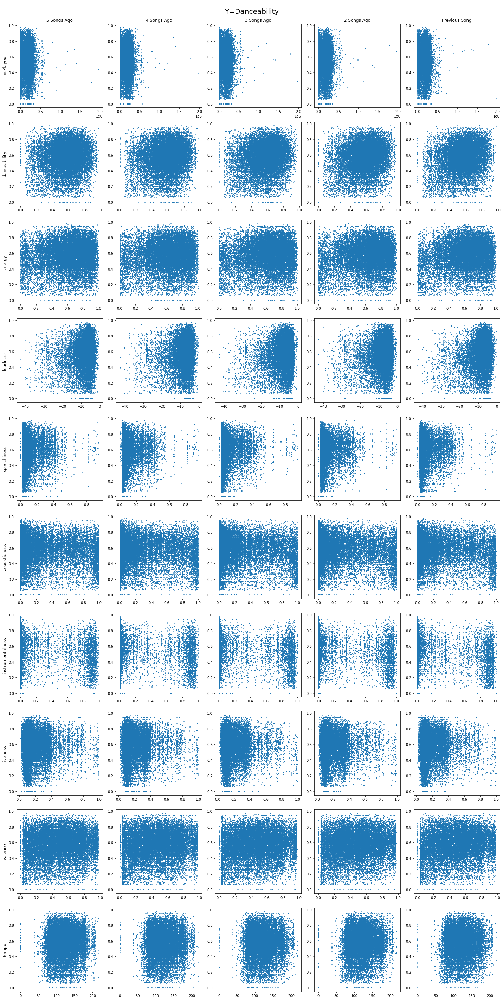

In [356]:
fig_graphs, fig_axes = plt.subplots(10,5, figsize=(20,40))
fig_axes[0,0].set_title("\n\n\n5 Songs Ago")
fig_axes[0,1].set_title("\n\n\n4 Songs Ago")
fig_axes[0,2].set_title("\n\n\n3 Songs Ago")
fig_axes[0,3].set_title("\n\n\n2 Songs Ago")
fig_axes[0,4].set_title("\n\n\nPrevious Song")
fig_axes[0,0].set_ylabel("msPlayed", size='large')
fig_axes[1,0].set_ylabel("danceability", size='large')
fig_axes[2,0].set_ylabel("energy", size='large')
fig_axes[3,0].set_ylabel("loudness", size='large')
fig_axes[4,0].set_ylabel("speechiness", size='large')
fig_axes[5,0].set_ylabel("acousticness", size='large')
fig_axes[6,0].set_ylabel("instrumentalness", size='large')
fig_axes[7,0].set_ylabel("liveness", size='large')
fig_axes[8,0].set_ylabel("valence", size='large')
fig_axes[9,0].set_ylabel("tempo", size='large')

for i in range(10):
    for j in range(5):
        fig_axes[i,j].scatter(last_five[input_cols[i] + "_" + str(j+1)],next_song["danceability"], s=4)

plt.suptitle("Y=Danceability",fontsize=20)
fig_graphs.tight_layout()

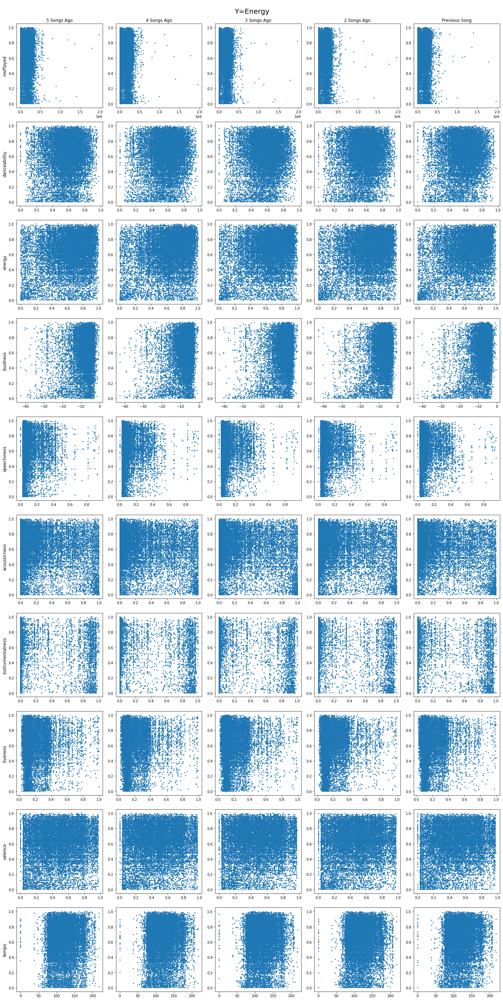

In [355]:
fig_graphs, fig_axes = plt.subplots(10,5, figsize=(20,40))
fig_axes[0,0].set_title("\n\n\n5 Songs Ago")
fig_axes[0,1].set_title("\n\n\n4 Songs Ago")
fig_axes[0,2].set_title("\n\n\n3 Songs Ago")
fig_axes[0,3].set_title("\n\n\n2 Songs Ago")
fig_axes[0,4].set_title("\n\n\nPrevious Song")
fig_axes[0,0].set_ylabel("msPlayed", size='large')
fig_axes[1,0].set_ylabel("danceability", size='large')
fig_axes[2,0].set_ylabel("energy", size='large')
fig_axes[3,0].set_ylabel("loudness", size='large')
fig_axes[4,0].set_ylabel("speechiness", size='large')
fig_axes[5,0].set_ylabel("acousticness", size='large')
fig_axes[6,0].set_ylabel("instrumentalness", size='large')
fig_axes[7,0].set_ylabel("liveness", size='large')
fig_axes[8,0].set_ylabel("valence", size='large')
fig_axes[9,0].set_ylabel("tempo", size='large')

for i in range(10):
    for j in range(5):
        fig_axes[i,j].scatter(last_five[input_cols[i] + "_" + str(j+1)],next_song["energy"],s=4)

plt.suptitle("Y=Energy",fontsize=20)
fig_graphs.tight_layout()

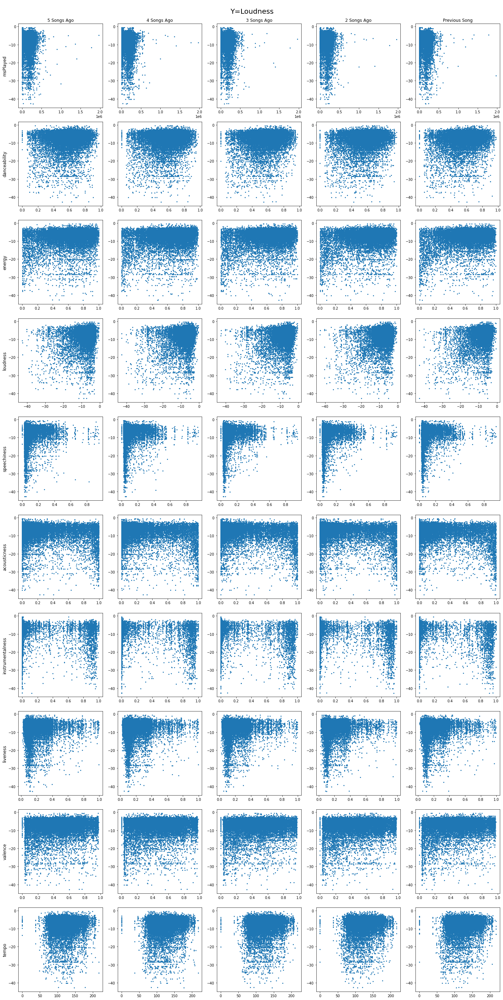

In [354]:
fig_graphs, fig_axes = plt.subplots(10,5, figsize=(20,40))
fig_axes[0,0].set_title("\n\n\n5 Songs Ago")
fig_axes[0,1].set_title("\n\n\n4 Songs Ago")
fig_axes[0,2].set_title("\n\n\n3 Songs Ago")
fig_axes[0,3].set_title("\n\n\n2 Songs Ago")
fig_axes[0,4].set_title("\n\n\nPrevious Song")
fig_axes[0,0].set_ylabel("msPlayed", size='large')
fig_axes[1,0].set_ylabel("danceability", size='large')
fig_axes[2,0].set_ylabel("energy", size='large')
fig_axes[3,0].set_ylabel("loudness", size='large')
fig_axes[4,0].set_ylabel("speechiness", size='large')
fig_axes[5,0].set_ylabel("acousticness", size='large')
fig_axes[6,0].set_ylabel("instrumentalness", size='large')
fig_axes[7,0].set_ylabel("liveness", size='large')
fig_axes[8,0].set_ylabel("valence", size='large')
fig_axes[9,0].set_ylabel("tempo", size='large')

for i in range(10):
    for j in range(5):
        fig_axes[i,j].scatter(last_five[input_cols[i] + "_" + str(j+1)],next_song["loudness"],s=4)

plt.suptitle("Y=Loudness",fontsize=20)
fig_graphs.tight_layout()

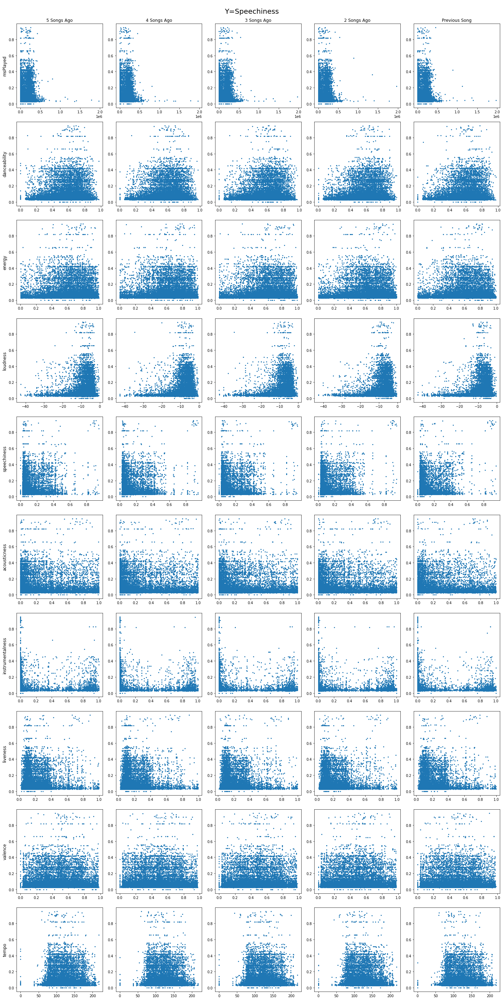

In [353]:
fig_graphs, fig_axes = plt.subplots(10,5, figsize=(20,40))
fig_axes[0,0].set_title("\n\n\n5 Songs Ago")
fig_axes[0,1].set_title("\n\n\n4 Songs Ago")
fig_axes[0,2].set_title("\n\n\n3 Songs Ago")
fig_axes[0,3].set_title("\n\n\n2 Songs Ago")
fig_axes[0,4].set_title("\n\n\nPrevious Song")
fig_axes[0,0].set_ylabel("msPlayed", size='large')
fig_axes[1,0].set_ylabel("danceability", size='large')
fig_axes[2,0].set_ylabel("energy", size='large')
fig_axes[3,0].set_ylabel("loudness", size='large')
fig_axes[4,0].set_ylabel("speechiness", size='large')
fig_axes[5,0].set_ylabel("acousticness", size='large')
fig_axes[6,0].set_ylabel("instrumentalness", size='large')
fig_axes[7,0].set_ylabel("liveness", size='large')
fig_axes[8,0].set_ylabel("valence", size='large')
fig_axes[9,0].set_ylabel("tempo", size='large')

for i in range(10):
    for j in range(5):
        fig_axes[i,j].scatter(last_five[input_cols[i] + "_" + str(j+1)],next_song["speechiness"], s=4)

plt.suptitle("Y=Speechiness",fontsize=20)
fig_graphs.tight_layout()

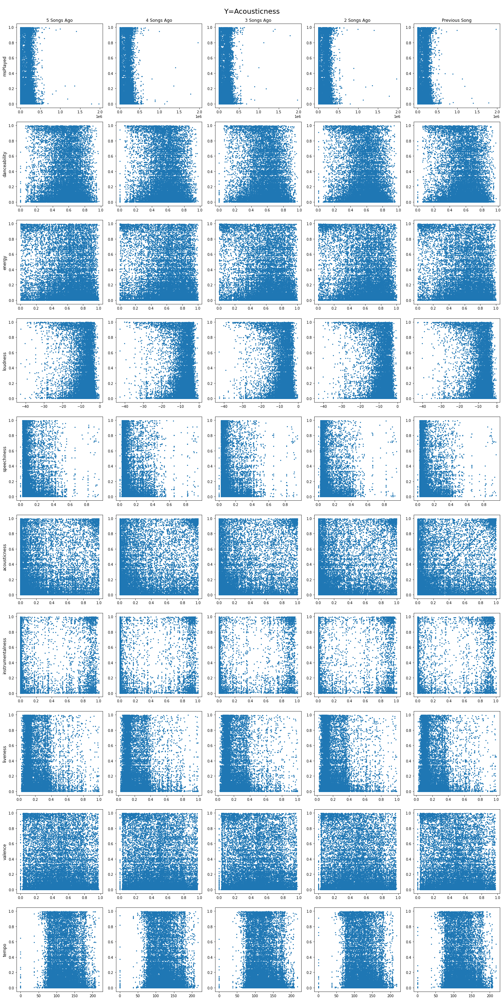

In [352]:
fig_graphs, fig_axes = plt.subplots(10,5, figsize=(20,40))
fig_axes[0,0].set_title("\n\n\n5 Songs Ago")
fig_axes[0,1].set_title("\n\n\n4 Songs Ago")
fig_axes[0,2].set_title("\n\n\n3 Songs Ago")
fig_axes[0,3].set_title("\n\n\n2 Songs Ago")
fig_axes[0,4].set_title("\n\n\nPrevious Song")
fig_axes[0,0].set_ylabel("msPlayed", size='large')
fig_axes[1,0].set_ylabel("danceability", size='large')
fig_axes[2,0].set_ylabel("energy", size='large')
fig_axes[3,0].set_ylabel("loudness", size='large')
fig_axes[4,0].set_ylabel("speechiness", size='large')
fig_axes[5,0].set_ylabel("acousticness", size='large')
fig_axes[6,0].set_ylabel("instrumentalness", size='large')
fig_axes[7,0].set_ylabel("liveness", size='large')
fig_axes[8,0].set_ylabel("valence", size='large')
fig_axes[9,0].set_ylabel("tempo", size='large')

for i in range(10):
    for j in range(5):
        fig_axes[i,j].scatter(last_five[input_cols[i] + "_" + str(j+1)],next_song["acousticness"],s=4)

plt.suptitle("Y=Acousticness",fontsize=20)
fig_graphs.tight_layout()

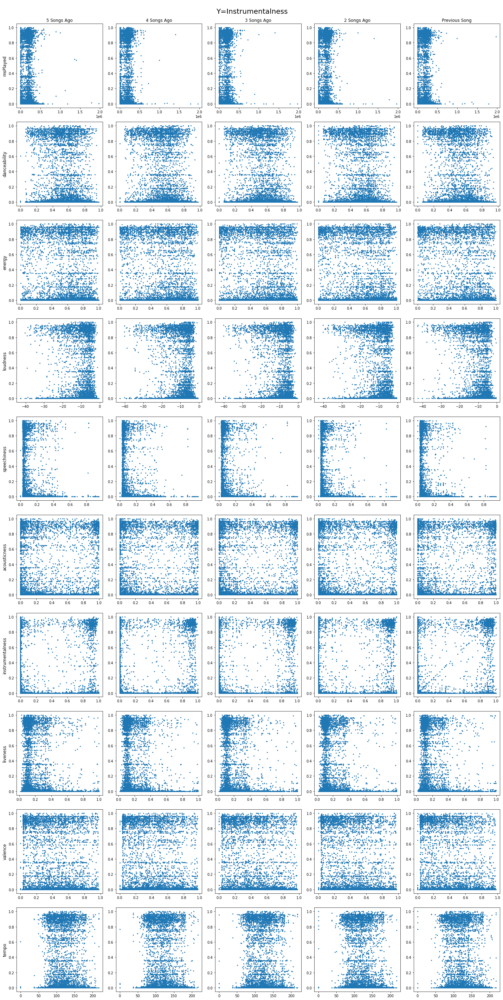

In [351]:
fig_graphs, fig_axes = plt.subplots(10,5, figsize=(20,40))
fig_axes[0,0].set_title("\n\n\n5 Songs Ago")
fig_axes[0,1].set_title("\n\n\n4 Songs Ago")
fig_axes[0,2].set_title("\n\n\n3 Songs Ago")
fig_axes[0,3].set_title("\n\n\n2 Songs Ago")
fig_axes[0,4].set_title("\n\n\nPrevious Song")
fig_axes[0,0].set_ylabel("msPlayed", size='large')
fig_axes[1,0].set_ylabel("danceability", size='large')
fig_axes[2,0].set_ylabel("energy", size='large')
fig_axes[3,0].set_ylabel("loudness", size='large')
fig_axes[4,0].set_ylabel("speechiness", size='large')
fig_axes[5,0].set_ylabel("acousticness", size='large')
fig_axes[6,0].set_ylabel("instrumentalness", size='large')
fig_axes[7,0].set_ylabel("liveness", size='large')
fig_axes[8,0].set_ylabel("valence", size='large')
fig_axes[9,0].set_ylabel("tempo", size='large')

for i in range(10):
    for j in range(5):
        fig_axes[i,j].scatter(last_five[input_cols[i] + "_" + str(j+1)],next_song["instrumentalness"],s=4)

plt.suptitle("Y=Instrumentalness",fontsize=20)
fig_graphs.tight_layout()

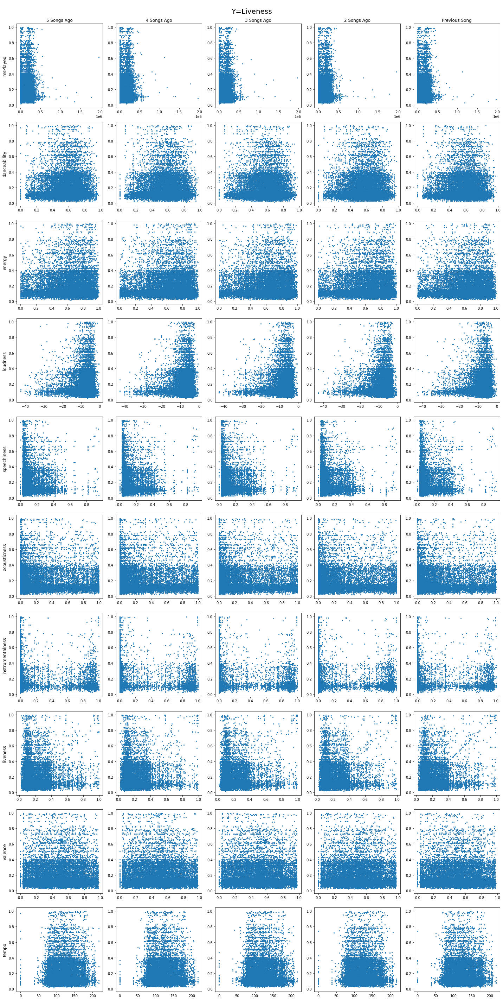

In [357]:
fig_graphs, fig_axes = plt.subplots(10,5, figsize=(20,40))
fig_axes[0,0].set_title("\n\n\n5 Songs Ago")
fig_axes[0,1].set_title("\n\n\n4 Songs Ago")
fig_axes[0,2].set_title("\n\n\n3 Songs Ago")
fig_axes[0,3].set_title("\n\n\n2 Songs Ago")
fig_axes[0,4].set_title("\n\n\nPrevious Song")
fig_axes[0,0].set_ylabel("msPlayed", size='large')
fig_axes[1,0].set_ylabel("danceability", size='large')
fig_axes[2,0].set_ylabel("energy", size='large')
fig_axes[3,0].set_ylabel("loudness", size='large')
fig_axes[4,0].set_ylabel("speechiness", size='large')
fig_axes[5,0].set_ylabel("acousticness", size='large')
fig_axes[6,0].set_ylabel("instrumentalness", size='large')
fig_axes[7,0].set_ylabel("liveness", size='large')
fig_axes[8,0].set_ylabel("valence", size='large')
fig_axes[9,0].set_ylabel("tempo", size='large')

for i in range(10):
    for j in range(5):
        fig_axes[i,j].scatter(last_five[input_cols[i] + "_" + str(j+1)],next_song["liveness"], s=4)

plt.suptitle("Y=Liveness",fontsize=20)
fig_graphs.tight_layout()

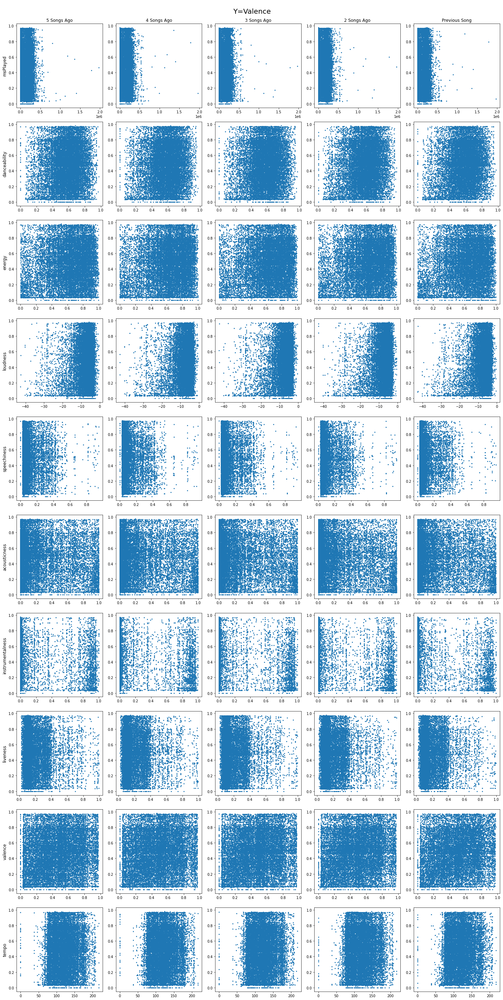

In [358]:
fig_graphs, fig_axes = plt.subplots(10,5, figsize=(20,40))
fig_axes[0,0].set_title("\n\n\n5 Songs Ago")
fig_axes[0,1].set_title("\n\n\n4 Songs Ago")
fig_axes[0,2].set_title("\n\n\n3 Songs Ago")
fig_axes[0,3].set_title("\n\n\n2 Songs Ago")
fig_axes[0,4].set_title("\n\n\nPrevious Song")
fig_axes[0,0].set_ylabel("msPlayed", size='large')
fig_axes[1,0].set_ylabel("danceability", size='large')
fig_axes[2,0].set_ylabel("energy", size='large')
fig_axes[3,0].set_ylabel("loudness", size='large')
fig_axes[4,0].set_ylabel("speechiness", size='large')
fig_axes[5,0].set_ylabel("acousticness", size='large')
fig_axes[6,0].set_ylabel("instrumentalness", size='large')
fig_axes[7,0].set_ylabel("liveness", size='large')
fig_axes[8,0].set_ylabel("valence", size='large')
fig_axes[9,0].set_ylabel("tempo", size='large')

for i in range(10):
    for j in range(5):
        fig_axes[i,j].scatter(last_five[input_cols[i] + "_" + str(j+1)],next_song["valence"],s=4)

plt.suptitle("Y=Valence",fontsize=20)
fig_graphs.tight_layout()

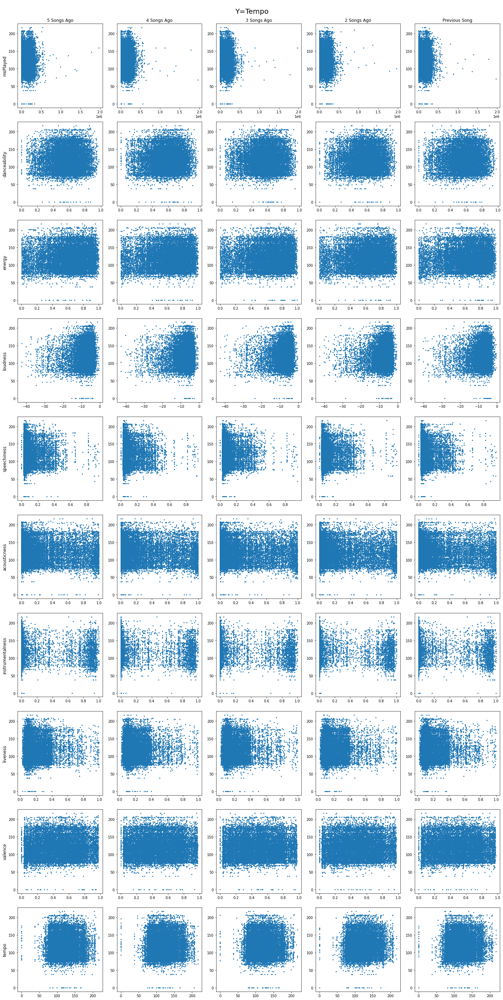

In [359]:
fig_graphs, fig_axes = plt.subplots(10,5, figsize=(20,40))
fig_axes[0,0].set_title("\n\n\n5 Songs Ago")
fig_axes[0,1].set_title("\n\n\n4 Songs Ago")
fig_axes[0,2].set_title("\n\n\n3 Songs Ago")
fig_axes[0,3].set_title("\n\n\n2 Songs Ago")
fig_axes[0,4].set_title("\n\n\nPrevious Song")
fig_axes[0,0].set_ylabel("msPlayed", size='large')
fig_axes[1,0].set_ylabel("danceability", size='large')
fig_axes[2,0].set_ylabel("energy", size='large')
fig_axes[3,0].set_ylabel("loudness", size='large')
fig_axes[4,0].set_ylabel("speechiness", size='large')
fig_axes[5,0].set_ylabel("acousticness", size='large')
fig_axes[6,0].set_ylabel("instrumentalness", size='large')
fig_axes[7,0].set_ylabel("liveness", size='large')
fig_axes[8,0].set_ylabel("valence", size='large')
fig_axes[9,0].set_ylabel("tempo", size='large')

for i in range(10):
    for j in range(5):
        fig_axes[i,j].scatter(last_five[input_cols[i] + "_" + str(j+1)],next_song["tempo"],s=4)

plt.suptitle("Y=Tempo",fontsize=20)
fig_graphs.tight_layout()

/var/folders/yr/s2z61dbj07bbz8m72jm2x6q00000gn/T/ipykernel_7145/2141778562.py:3: FutureWarning: Indexing with a float is deprecated, and will raise an IndexError in pandas 2.0. You can manually convert to an integer key instead.
  fig_axes[i,0].set_ylabel("next_" + next_song.columns[i/2], size='large')
/var/folders/yr/s2z61dbj07bbz8m72jm2x6q00000gn/T/ipykernel_7145/2141778562.py:4: FutureWarning: Indexing with a float is deprecated, and will raise an IndexError in pandas 2.0. You can manually convert to an integer key instead.
  fig_axes[i+1,0].set_ylabel("next_" + next_song.columns[i/2], size='large')
/var/folders/yr/s2z61dbj07bbz8m72jm2x6q00000gn/T/ipykernel_7145/2141778562.py:16: FutureWarning: Indexing with a float is deprecated, and will raise an IndexError in pandas 2.0. You can manually convert to an integer key instead.
  fig_axes[row,col].scatter(last_five[input_cols[j] + "_5"],next_song[next_song.columns[i/2]], s=4)


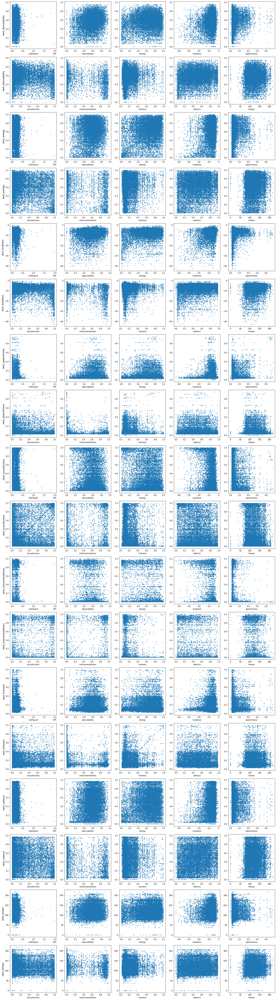

In [385]:
fig_graphs, fig_axes = plt.subplots(18,5, figsize=(20,72))
for i in range(0,2*len(next_song.columns),2):
    fig_axes[i,0].set_ylabel("next_" + next_song.columns[i/2], size='large')
    fig_axes[i+1,0].set_ylabel("next_" + next_song.columns[i/2], size='large')


for i in range(0,18,2):
    for j in range(10):
        col = j
        row = i
        if j >= 5:
            col = j % 5
            row += 1
        
        try:
            fig_axes[row,col].scatter(last_five[input_cols[j] + "_5"],next_song[next_song.columns[i/2]], s=4)
            fig_axes[row,col].set_xlabel(input_cols[j])
        except:
            display(f"row: {row}, col: {col}, i: {i}, j: {j}")

fig_graphs.tight_layout()
plt.savefig("prev_song_analysis.png")

In [381]:
list(range(0,len(next_song.columns) * 2,2))

[0, 2, 4, 6, 8, 10, 12, 14, 16]

[0, 2, 4, 6, 8, 10, 12, 14, 16]

# Data Conclusions
---
It seems that the the only values that are remotely predictable are Liveliness, Speechiness, and Loudness. The rest are wholely unpredictable.